<a href="https://colab.research.google.com/github/Arunkumaranup/Course/blob/master/EDA_HR_data_pipeline_OpenS_and_to_be_shared.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# This is a notebook that everyone can access at the same time - Please make a copy by going to > FILE > Save a Copy

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Reading Data
#### Dictionary/Details of the dataset can be found at: https://rpubs.com/rhuebner/hrd_cb_v14

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Webinars/Upgrad/HRDataset_v14.csv')
df.head(5)

,Employee_Name,EmpID,MarriedID,MaritalStatusID,GenderID,EmpStatusID,DeptID,PerfScoreID,FromDiversityJobFairID,Salary,Termd,PositionID,Position,State,Zip,DOB,Sex,MaritalDesc,CitizenDesc,HispanicLatino,RaceDesc,DateofHire,DateofTermination,TermReason,EmploymentStatus,Department,ManagerName,ManagerID,RecruitmentSource,PerformanceScore,EngagementSurvey,EmpSatisfaction,SpecialProjectsCount,LastPerformanceReview_Date,DaysLateLast30,Absences
0,"Adinolfi, Wilson K",10026,0,0,1,1,5,4,0,62506,0,19,Production Technician I,MA,1960,7/10/1983,M,Single,US Citizen,No,White,7/5/2011,NaN,N/A-StillEmployed,Active,Production,Michael Albert,22.0,LinkedIn,Exceeds,4.60,5,0,1/17/2019,0,1
1,"Ait Sidi, Karthikeyan",10084,1,1,1,5,3,3,0,104437,1,27,Sr. DBA,MA,2148,5/5/1975,M,Married,US Citizen,No,White,3/30/2015,6/16/2016,career change,Voluntarily Terminated,IT/IS,Simon Roup,4.0,Indeed,Fully Meets,4.96,3,6,2/24/2016,0,17
2,"Akinkuolie, Sarah",10196,1,1,0,5,5,3,0,64955,1,20,Production Technician II,MA,1810,9/19/1988,F,Married,US Citizen,No,White,7/5/2011,9/24/2012,hours,Voluntarily Terminated,Production,Kissy Sullivan,20.0,LinkedIn,Fully Meets,3.02,3,0,5/15/2012,0,3
3,"Alagbe,Trina",10088,1,1,0,1,5,3,0,64991,0,19,Production Technician I,MA,1886,9/27/1988,F,Married,US Citizen,No,White,1/7/2008,NaN,N/A-StillEmployed,Active,Production,Elijiah Gray,16.0,Indeed,Fully Meets,4.84,5,0,1/3/2019,0,15
4,"Anderson, Carol",10069,0,2,0,5,5,3,0,50825,1,19,Production Technician I,MA,2169,9/8/1989,F,Divorced,US Citizen,No,White,7/11/2011,9/6/2016,return to school,Voluntarily Terminated,Production,Webster Butler,39.0,Google Search,Fully Meets,5.00,4,0,2/1/2016,0,2


### Quick Summary

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 311 entries, 0 to 310
Data columns (total 36 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Employee_Name               311 non-null    object 
 1   EmpID                       311 non-null    int64  
 2   MarriedID                   311 non-null    int64  
 3   MaritalStatusID             311 non-null    int64  
 4   GenderID                    311 non-null    int64  
 5   EmpStatusID                 311 non-null    int64  
 6   DeptID                      311 non-null    int64  
 7   PerfScoreID                 311 non-null    int64  
 8   FromDiversityJobFairID      311 non-null    int64  
 9   Salary                      311 non-null    int64  
 10  Termd                       311 non-null    int64  
 11  PositionID                  311 non-null    int64  
 12  Position                    311 non-null    object 
 13  State                       311 non

In [ ]:
df.dtypes.value_counts()

object     18
int64      16
float64     2
dtype: int64

In [ ]:
df.select_dtypes("object").head(5)

,Employee_Name,Position,State,DOB,Sex,MaritalDesc,CitizenDesc,HispanicLatino,RaceDesc,DateofHire,DateofTermination,TermReason,EmploymentStatus,Department,ManagerName,RecruitmentSource,PerformanceScore,LastPerformanceReview_Date
0,"Adinolfi, Wilson K",Production Technician I,MA,7/10/1983,M,Single,US Citizen,No,White,7/5/2011,NaN,N/A-StillEmployed,Active,Production,Michael Albert,LinkedIn,Exceeds,1/17/2019
1,"Ait Sidi, Karthikeyan",Sr. DBA,MA,5/5/1975,M,Married,US Citizen,No,White,3/30/2015,6/16/2016,career change,Voluntarily Terminated,IT/IS,Simon Roup,Indeed,Fully Meets,2/24/2016
2,"Akinkuolie, Sarah",Production Technician II,MA,9/19/1988,F,Married,US Citizen,No,White,7/5/2011,9/24/2012,hours,Voluntarily Terminated,Production,Kissy Sullivan,LinkedIn,Fully Meets,5/15/2012
3,"Alagbe,Trina",Production Technician I,MA,9/27/1988,F,Married,US Citizen,No,White,1/7/2008,NaN,N/A-StillEmployed,Active,Production,Elijiah Gray,Indeed,Fully Meets,1/3/2019
4,"Anderson, Carol",Production Technician I,MA,9/8/1989,F,Divorced,US Citizen,No,White,7/11/2011,9/6/2016,return to school,Voluntarily Terminated,Production,Webster Butler,Google Search,Fully Meets,2/1/2016


In [ ]:
df.describe()

,EmpID,MarriedID,MaritalStatusID,GenderID,EmpStatusID,DeptID,PerfScoreID,FromDiversityJobFairID,Salary,Termd,PositionID,Zip,ManagerID,EngagementSurvey,EmpSatisfaction,SpecialProjectsCount,DaysLateLast30,Absences
count,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,303.000000,311.000000,311.000000,311.000000,311.000000,311.000000
mean,10156.000000,0.398714,0.810289,0.434084,2.392283,4.610932,2.977492,0.093248,69020.684887,0.334405,16.845659,6555.482315,14.570957,4.110000,3.890675,1.218650,0.414791,10.237942
std,89.922189,0.490423,0.943239,0.496435,1.794383,1.083487,0.587072,0.291248,25156.636930,0.472542,6.223419,16908.396884,8.078306,0.789938,0.909241,2.349421,1.294519,5.852596
min,10001.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,45046.000000,0.000000,1.000000,1013.000000,1.000000,1.120000,1.000000,0.000000,0.000000,1.000000
25%,10078.500000,0.000000,0.000000,0.000000,1.000000,5.000000,3.000000,0.000000,55501.500000,0.000000,18.000000,1901.500000,10.000000,3.690000,3.000000,0.000000,0.000000,5.000000
50%,10156.000000,0.000000,1.000000,0.000000,1.000000,5.000000,3.000000,0.000000,62810.000000,0.000000,19.000000,2132.000000,15.000000,4.280000,4.000000,0.000000,0.000000,10.000000
75%,10233.500000,1.000000,1.000000,1.000000,5.000000,5.000000,3.000000,0.000000,72036.000000,1.000000,20.000000,2355.000000,19.000000,4.700000,5.000000,0.000000,0.000000,15.000000
max,10311.000000,1.000000,4.000000,1.000000,5.000000,6.000000,4.000000,1.000000,250000.000000,1.000000,30.000000,98052.000000,39.000000,5.000000,5.000000,8.000000,6.000000,20.000000


### Other useful summary tools

In [ ]:
#!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

from pandas_profiling import ProfileReport

In [ ]:
profile = ProfileReport(df, title = "HR dataset", html = {'style' : {'full_width' : True}})

In [ ]:
profile.to_notebook_iframe()

In [ ]:
#!pip install sweetviz
import sweetviz as sv

                                             |          | [  0%]   00:00 -> (? left)


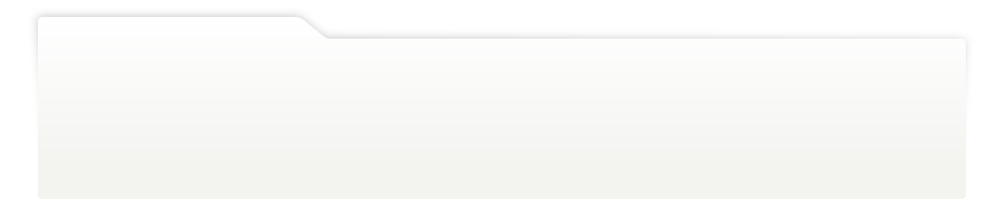
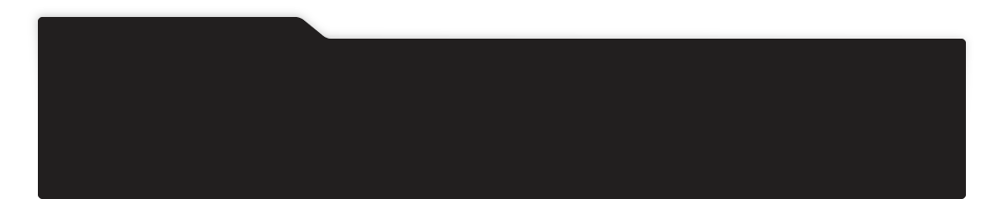
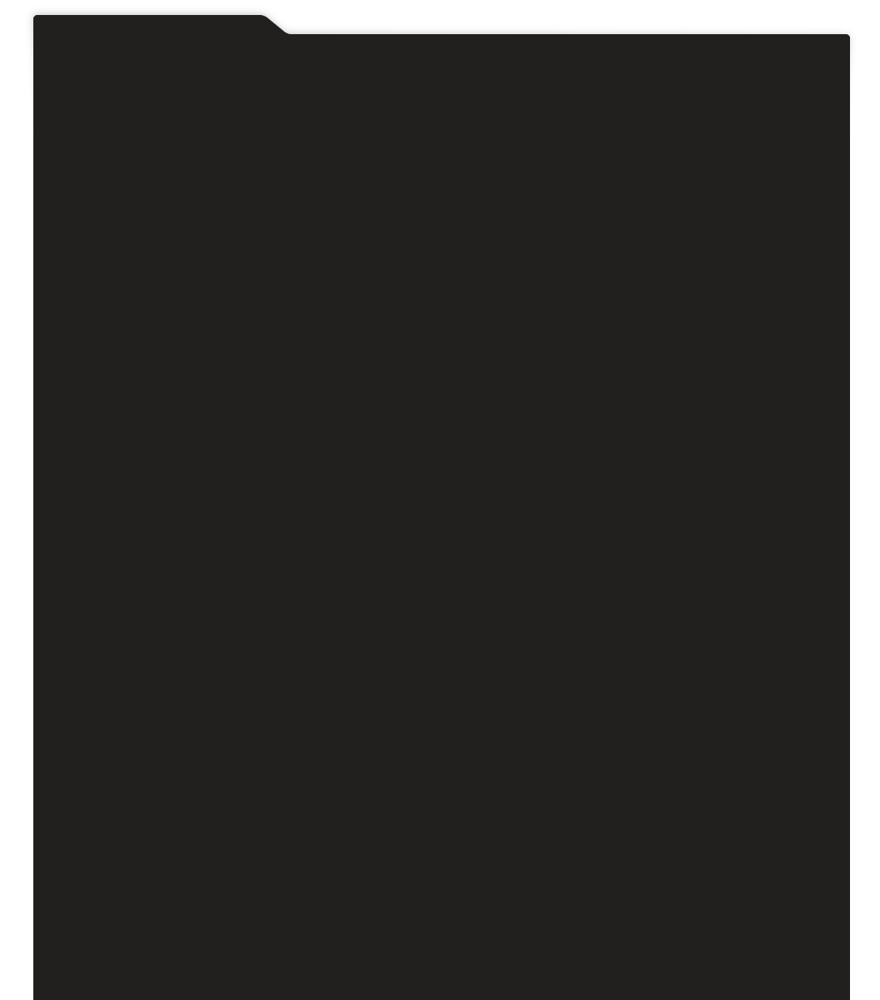
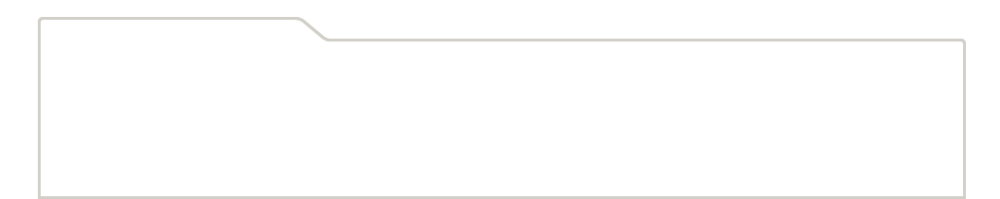
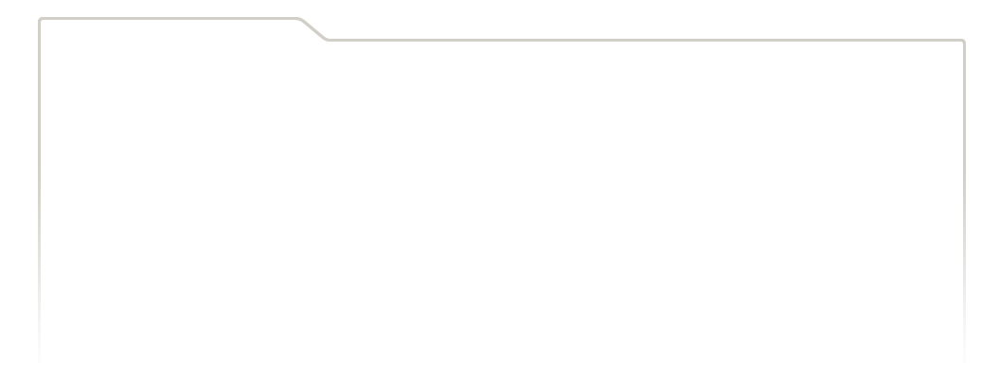
...
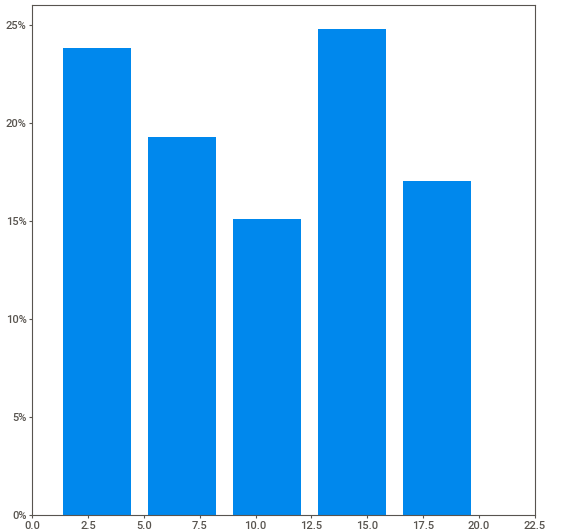
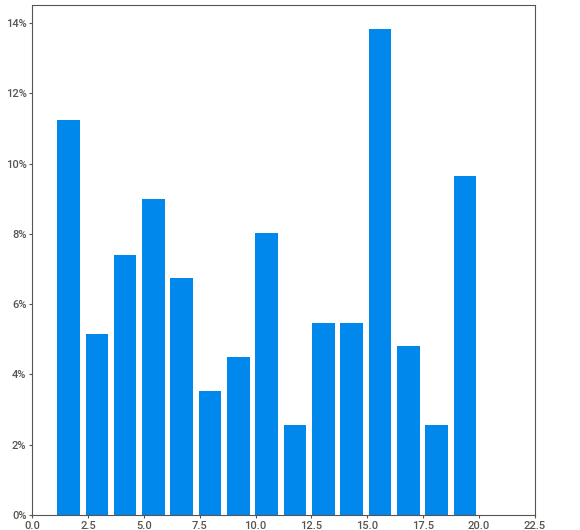
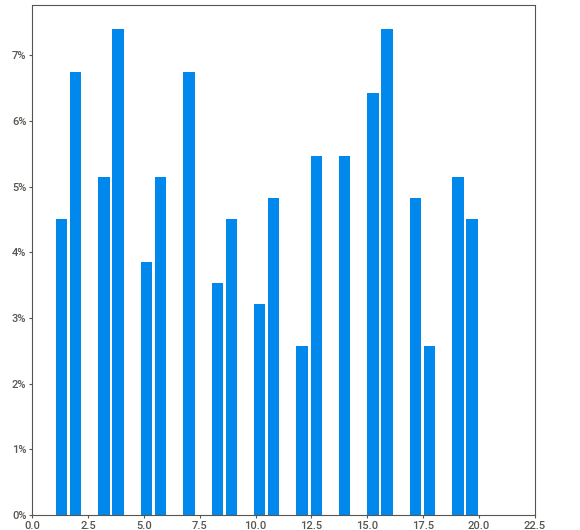
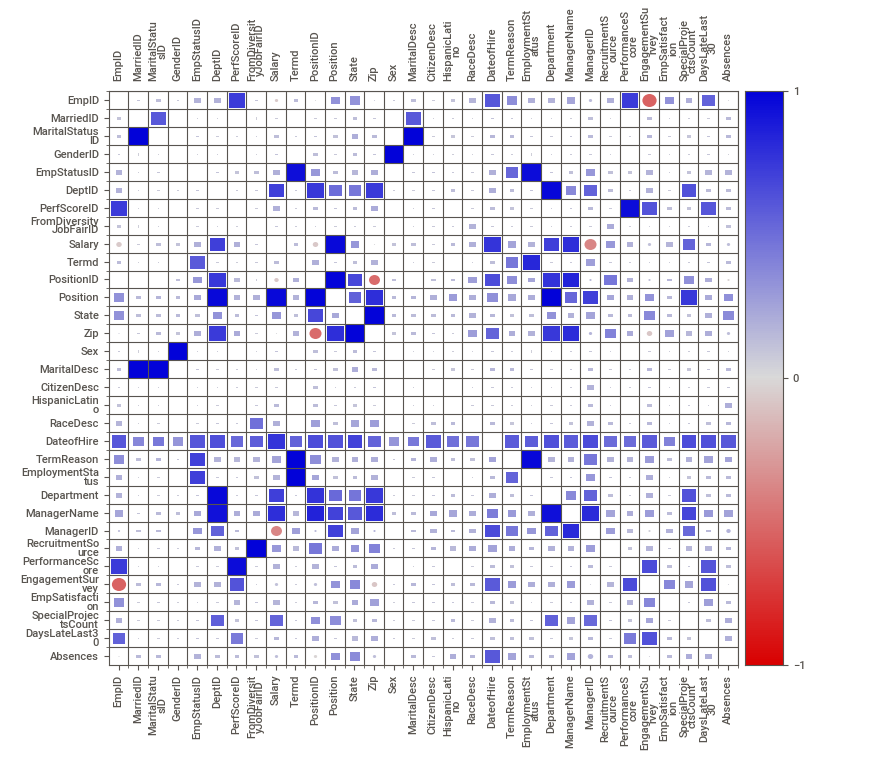
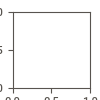

In [ ]:
my_report = sv.analyze(df)
my_report.show_notebook()

# Getting hands on - Always the best idea!

###### Transforming Date Variables

In [ ]:
%matplotlib inline
plt.close('all')

In [ ]:
from datetime import datetime
df['DateofHire'] = pd.to_datetime(df['DateofHire'], format='%m/%d/%Y')
df['DateofTermination'] = pd.to_datetime(df['DateofTermination'], format='%m/%d/%Y')
df[['DateofHire','DateofTermination']].head()

,DateofHire,DateofTermination
0,2011-07-05,NaT
1,2015-03-30,2016-06-16
2,2011-07-05,2012-09-24
3,2008-01-07,NaT
4,2011-07-11,2016-09-06


### Exploring Demographic Variables - Lay of the land




In [ ]:
print("Total Population in Data: {}".format(df.shape[0]))

Total Population in Data: 311


In [ ]:
# Is the data at a unique ID level?

print("Unique Empl IDs are : {}".format(df['EmpID'].nunique()))

Unique Empl IDs are : 311


Popultion by Gender


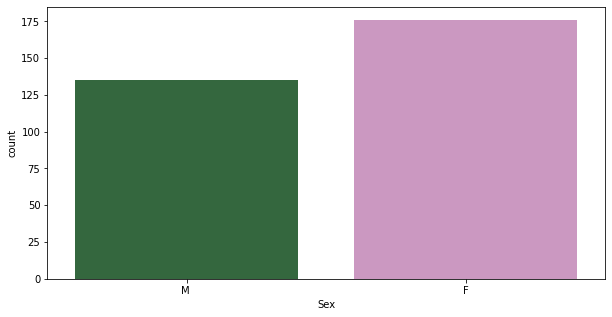

In [ ]:
print("Popultion by Gender")

plt.figure(figsize=(10,5))
sns.countplot(x='Sex', data=df, palette='cubehelix')
plt.show()

#### Always helps to express distributions in percentages 
######create a function to transform the data

In [ ]:
def perc_pivot(in_df, grp_var):
  d1 = pd.DataFrame(df.groupby(grp_var)['EmpID'].nunique())
  d2 = d1/d1[d1.columns].sum()*100
  return(d2.reset_index())

In [ ]:
perc_pivot(df, 'Sex')

,Sex,EmpID
0,F,56.59164
1,M,43.40836


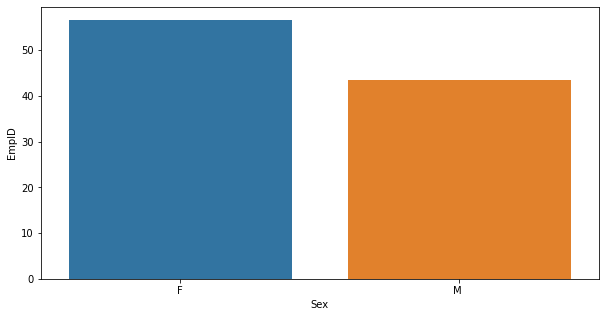

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x="Sex", y="EmpID", data=perc_pivot(df, 'Sex'))
plt.show()

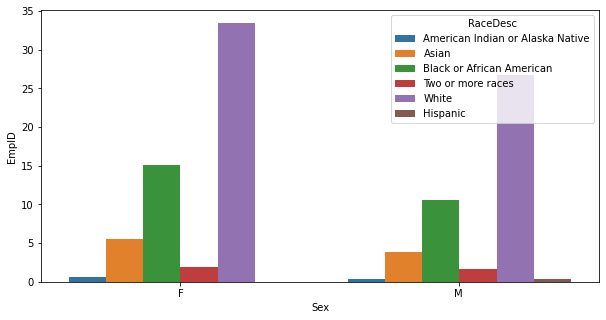

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x="Sex", y="EmpID", hue = 'RaceDesc', data=perc_pivot(df, ['Sex', 'RaceDesc']))
plt.show()


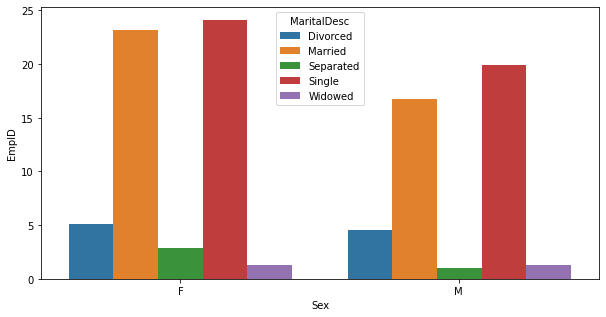

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x="Sex", y="EmpID", hue = 'MaritalDesc', data=perc_pivot(df, ['Sex', 'MaritalDesc']))
plt.show()


/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:337: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:670: UserWarning: Using the barplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


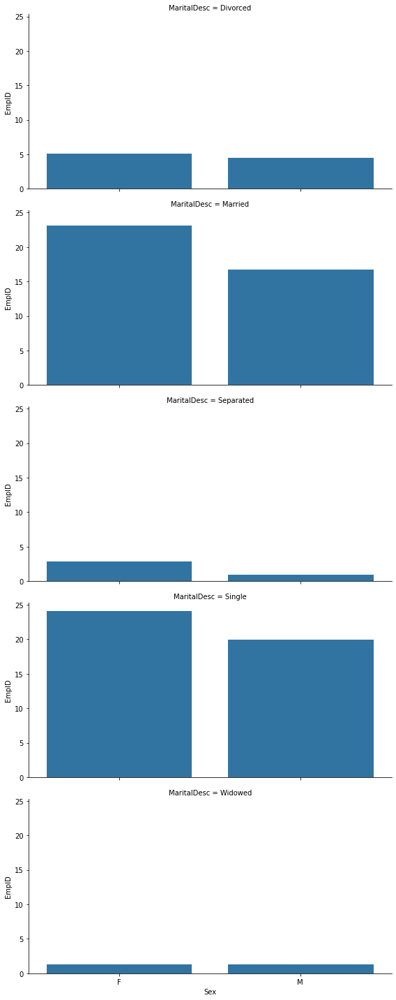

In [ ]:
g = sns.FacetGrid(data = perc_pivot(df, ['Sex', 'MaritalDesc']), row="MaritalDesc",
                  palette="Set3", size=4, aspect=2)
g.map(sns.barplot, 'Sex', 'EmpID')

<Figure size 720x360 with 0 Axes>

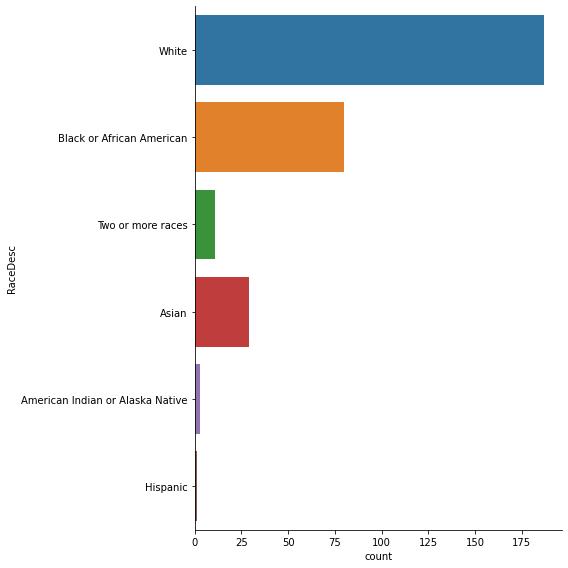

In [ ]:
plt.figure(figsize=(10,5))
sns.catplot(y='RaceDesc', data=df, kind='count', height=8, aspect=1)

In [ ]:
g = sns.FacetGrid(data = perc_pivot(df, ['Sex', 'MaritalDesc', 'RaceDesc']), row="MaritalDesc", col = 'RaceDesc', 
                  palette="Set3", size=18, aspect=2)
g.map(sns.barplot, 'Sex', 'EmpID')

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:337: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:670: UserWarning: Using the barplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


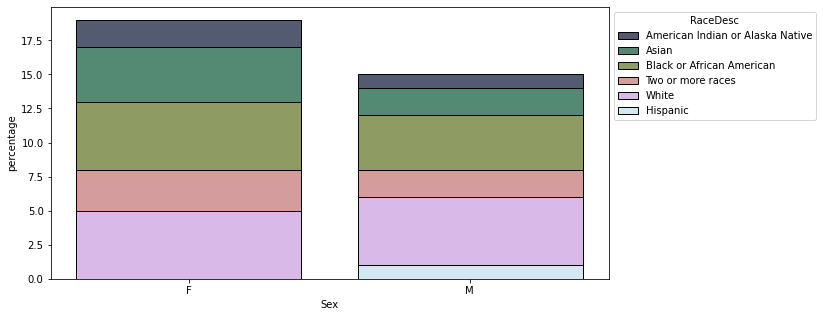

In [ ]:
plt.figure(figsize=(10,5))

ax = sns.histplot(perc_pivot(df, ['Sex', 'MaritalDesc', 'RaceDesc']), 
                  x='Sex', hue='RaceDesc',
             multiple='stack', palette='cubehelix', shrink=0.8)
ax.set_ylabel('percentage')
# Fix the legend so it's not on top of the bars.
legend = ax.get_legend()
legend.set_bbox_to_anchor((1, 1))

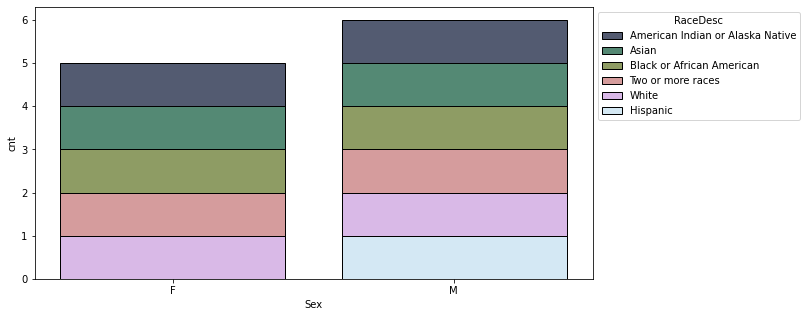

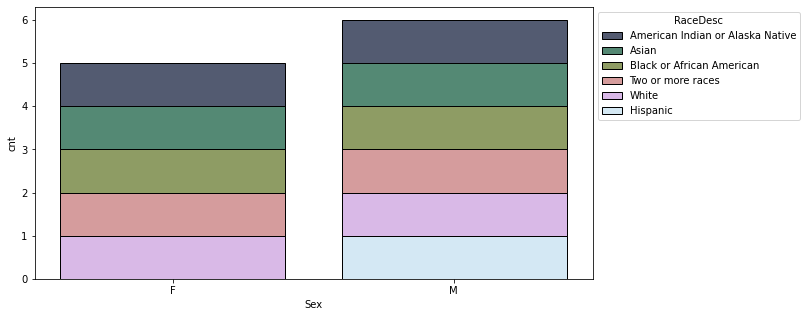

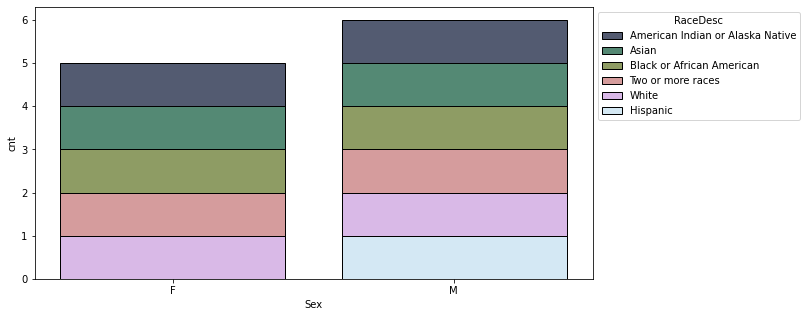

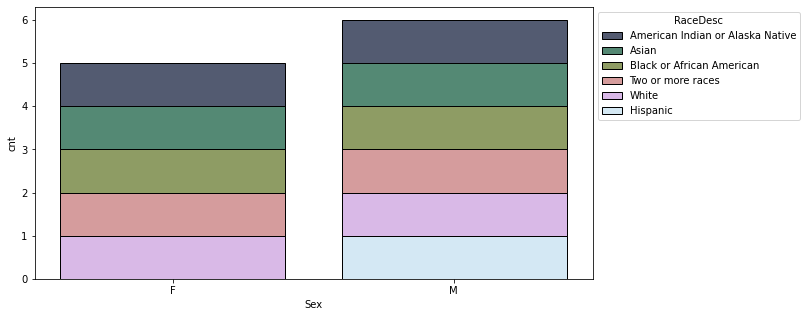

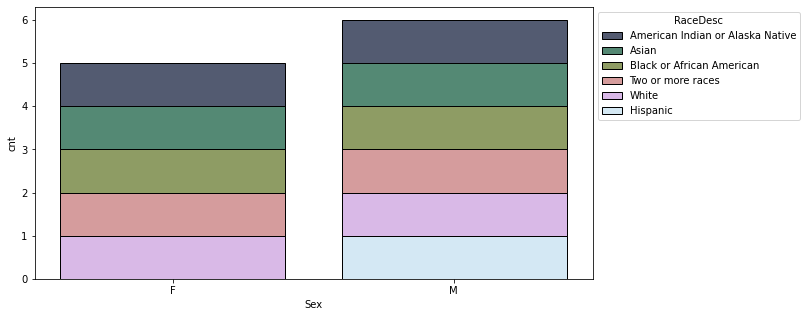

In [ ]:

for x in df['MaritalDesc'].unique():
    
    subset_df = df[df['MaritalDesc'] == x]
    plt.figure(figsize=(10,5))

    ax = sns.histplot(perc_pivot(subset_df, ['Sex', 'RaceDesc']), 
                      x='Sex', hue='RaceDesc',
                multiple='stack', palette='cubehelix', shrink=0.8)
    ax.set_ylabel('cnt')
    # Fix the legend so it's not on top of the bars.
    legend = ax.get_legend()
    legend.set_bbox_to_anchor((1, 1))

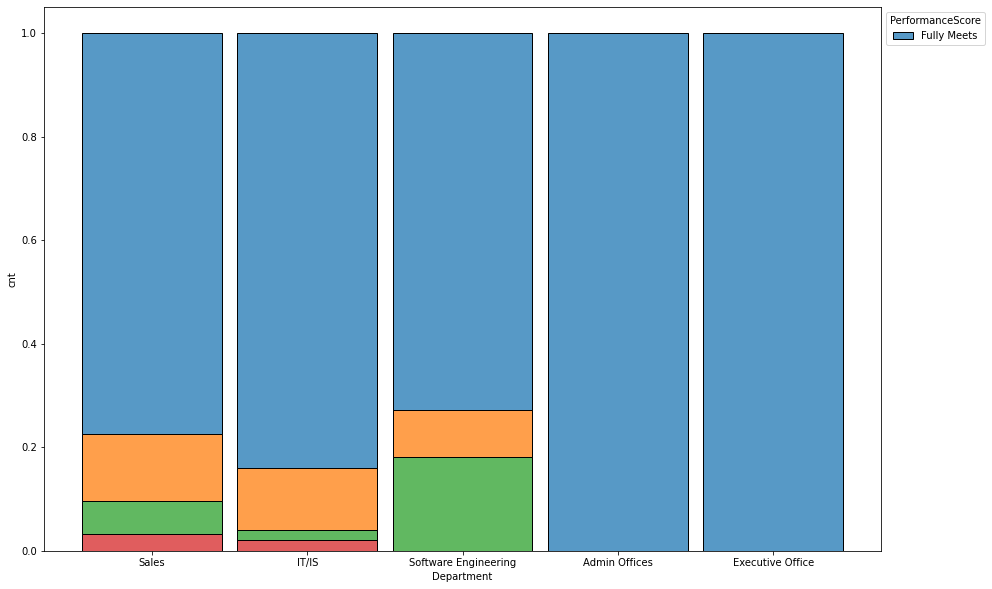

In [ ]:
plt.figure(figsize=(15, 10))

dps = ['Sales', 'IT/IS', 'Software Engineering',
       'Admin Offices', 'Executive Office','Production']

for dp in dps:
    ax = sns.histplot(x='Department', hue='PerformanceScore', multiple='stack', shrink=.9, stat='probability', data=df[df['Department']==dp])
    ax.set_ylabel('cnt')
    # Fix the legend so it's not on top of the bars.
    legend = ax.get_legend()
    legend.set_bbox_to_anchor((1, 1))

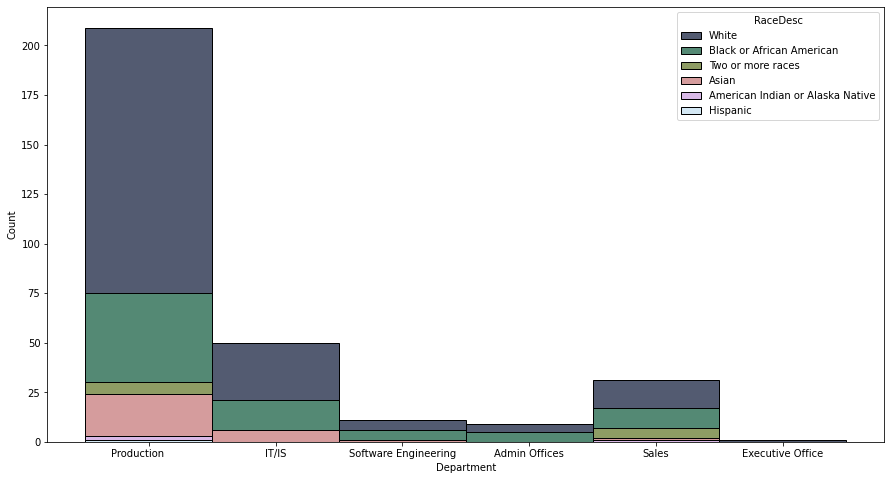

In [ ]:
plt.figure(figsize=(15, 8))
sns.histplot(x='Department', hue='RaceDesc', multiple='stack', data=df, palette='cubehelix')

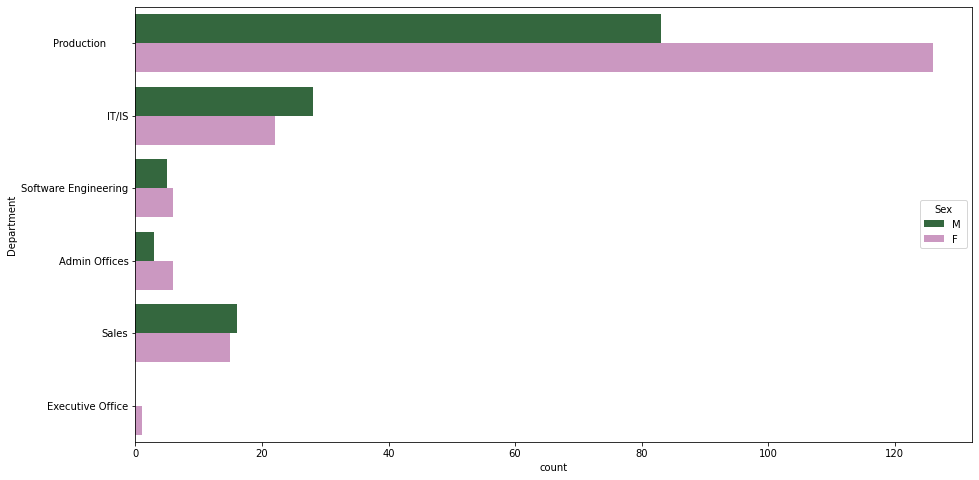

In [ ]:
plt.figure(figsize=(15,8))
sns.countplot(y=df['Department'], hue=df['Sex'], palette='cubehelix')

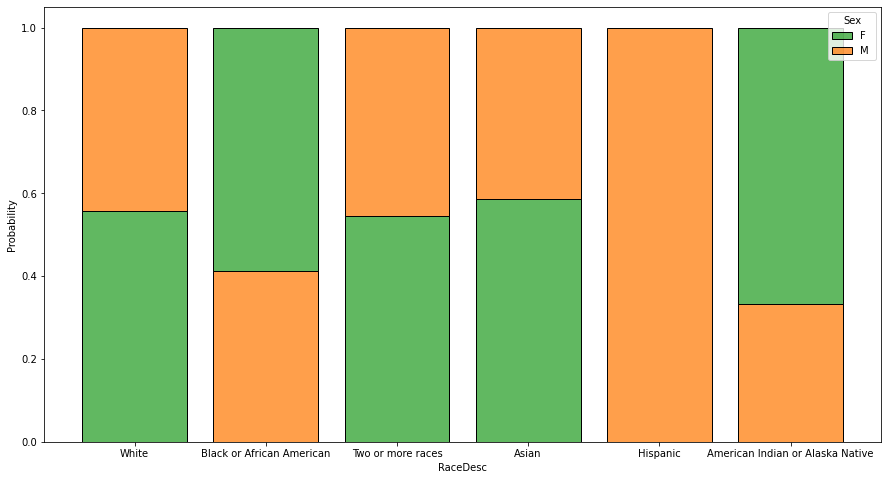

In [ ]:
palette1 ={"M ": "C1", "F": "C2"}
races = ['White', 'Black or African American', 'Two or more races', 'Asian', 'Hispanic', 'American Indian or Alaska Native']
palette2 ={'White':"C0", 'Black or African American':"C1", 'Two or more races':"C2", 'Asian':"C3", 'Hispanic':"C4", 'American Indian or Alaska Native':"C5"}
plt.figure(figsize=(15, 8))
for r in races:
    sns.histplot(x='RaceDesc', hue="Sex", multiple="stack", data=df[df['RaceDesc']==r], 
                 palette=palette1, stat='probability', shrink=.8)

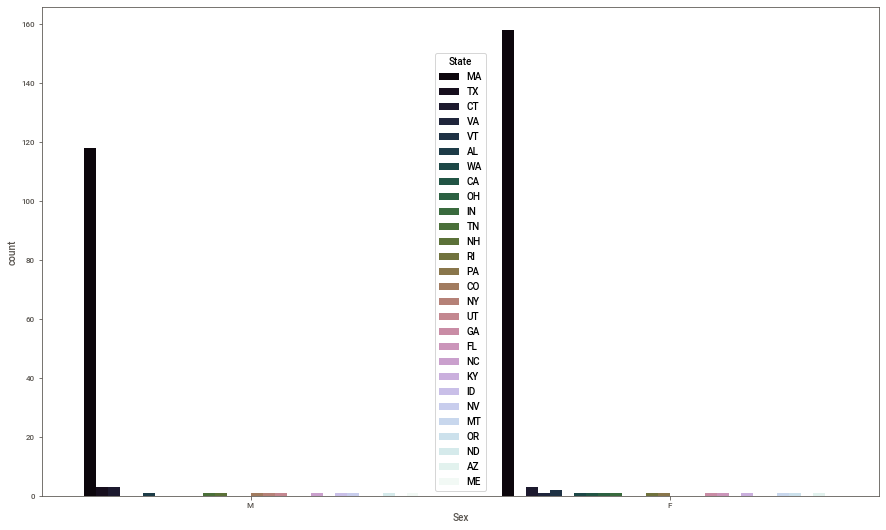

In [ ]:
plt.figure(figsize=(15,9))
sns.countplot(x='Sex', hue = 'State', data=df, palette='cubehelix')
plt.show()

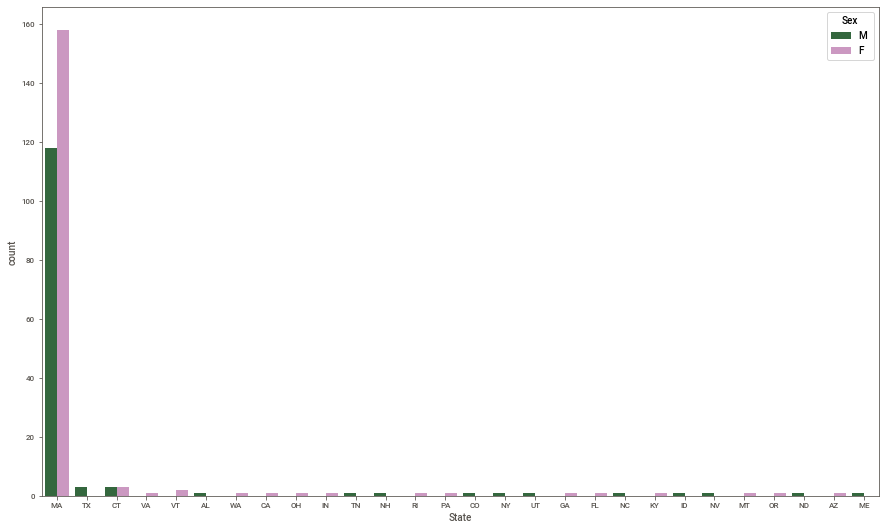

In [ ]:
# Flip the dims

plt.figure(figsize=(15,9))
sns.countplot(x='State', hue = 'Sex', data=df, palette='cubehelix')
plt.show()

In [ ]:
# Still not able to infer? Try to look at top or bottom states

df.groupby('State')['EmpID'].nunique().sort_values(ascending = False).head()

State
MA    276
CT      6
TX      3
VT      2
WA      1
Name: EmpID, dtype: int64

In [ ]:
top_states = df.groupby('State')['EmpID'].nunique().sort_values(ascending = False).head().index
top_states

Index(['MA', 'CT', 'TX', 'VT', 'WA'], dtype='object', name='State')

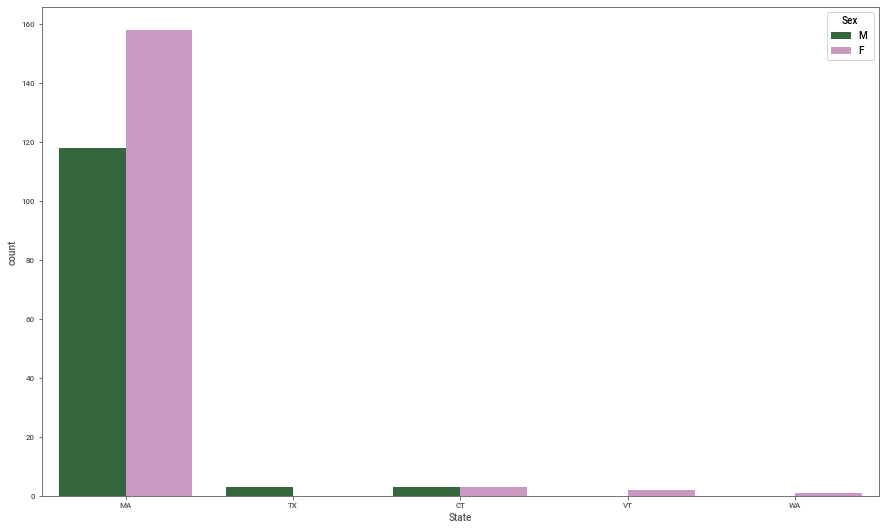

In [ ]:
plt.figure(figsize=(15,9))
sns.countplot(x='State', hue = 'Sex', data=df[df['State'].isin(top_states)], palette='cubehelix')
plt.show()

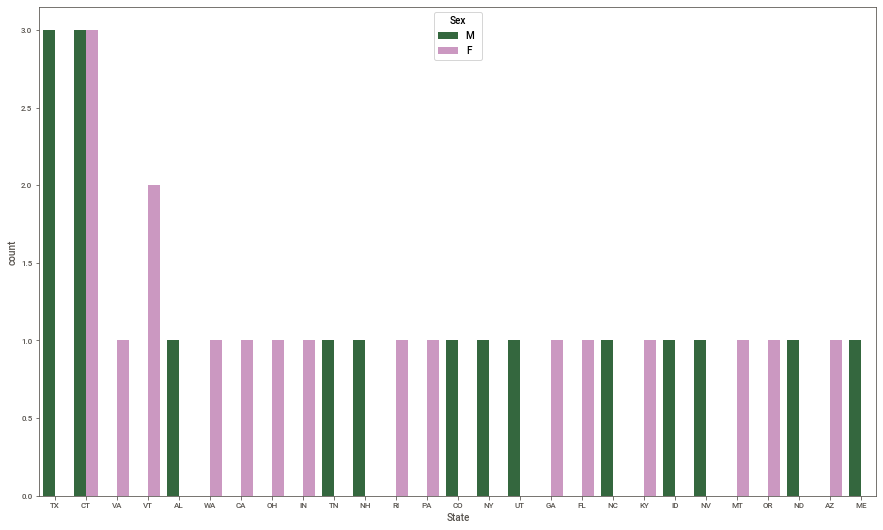

In [ ]:
plt.figure(figsize=(15,9))
sns.countplot(x='State', hue = 'Sex', data=df[df['State'] != "MA"], palette='cubehelix')
plt.show()

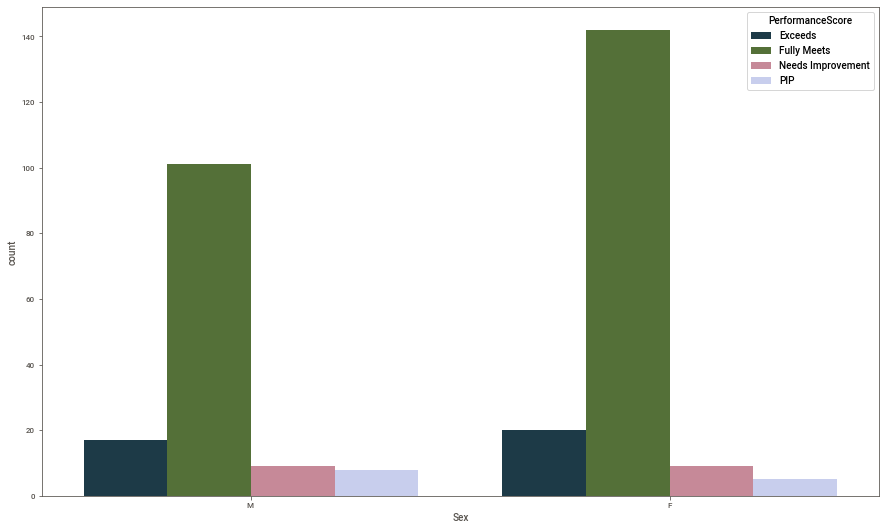

In [ ]:
plt.figure(figsize=(15,9))
sns.countplot(x='Sex', hue = 'PerformanceScore', data=df, palette='cubehelix')
plt.show()

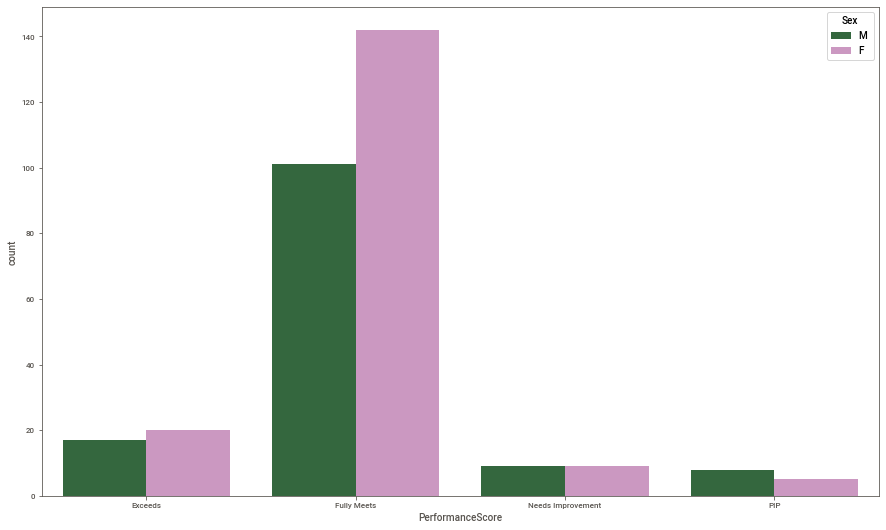

In [ ]:
plt.figure(figsize=(15,9))
sns.countplot(x='PerformanceScore', hue = 'Sex', data=df, palette='cubehelix')
plt.show()

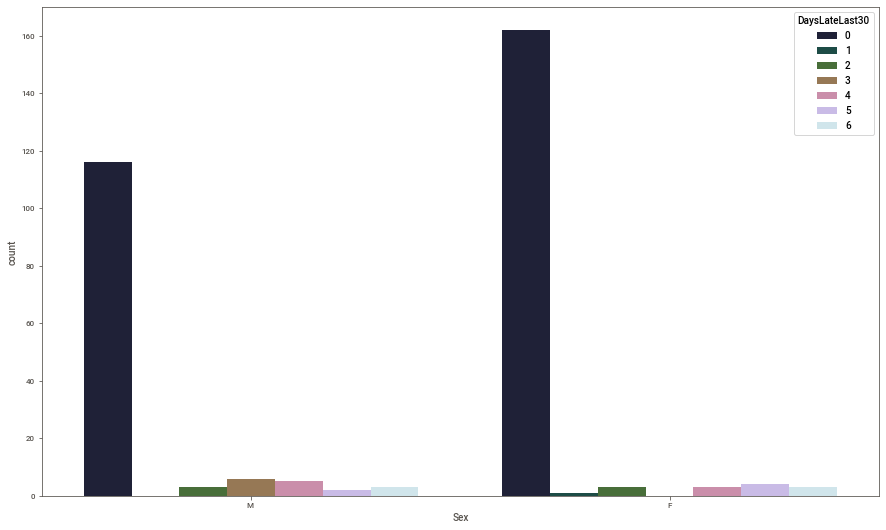

In [ ]:
plt.figure(figsize=(15,9))
sns.countplot(x='Sex', hue = 'DaysLateLast30', data=df, palette='cubehelix')
plt.show()

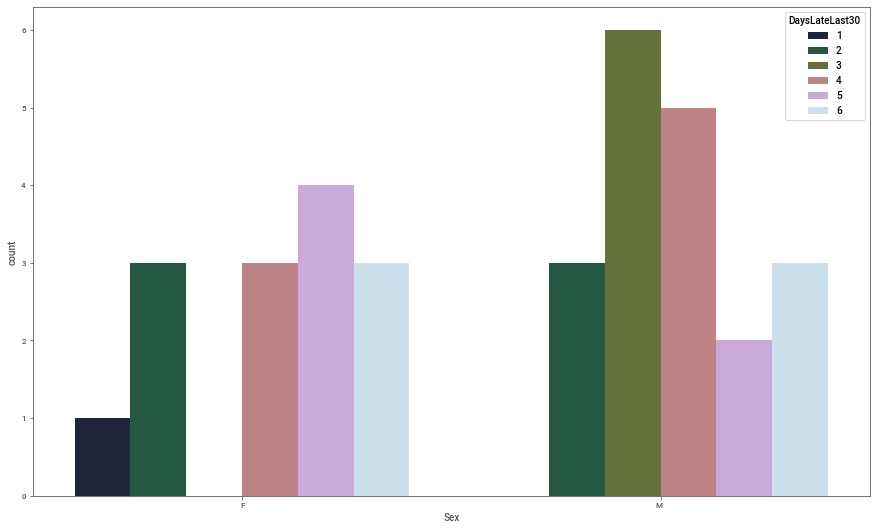

In [ ]:
plt.figure(figsize=(15,9))
sns.countplot(x='Sex', hue = 'DaysLateLast30', data=df[df['DaysLateLast30']!= 0], palette='cubehelix')
plt.show()

##### Focusing on Salary

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


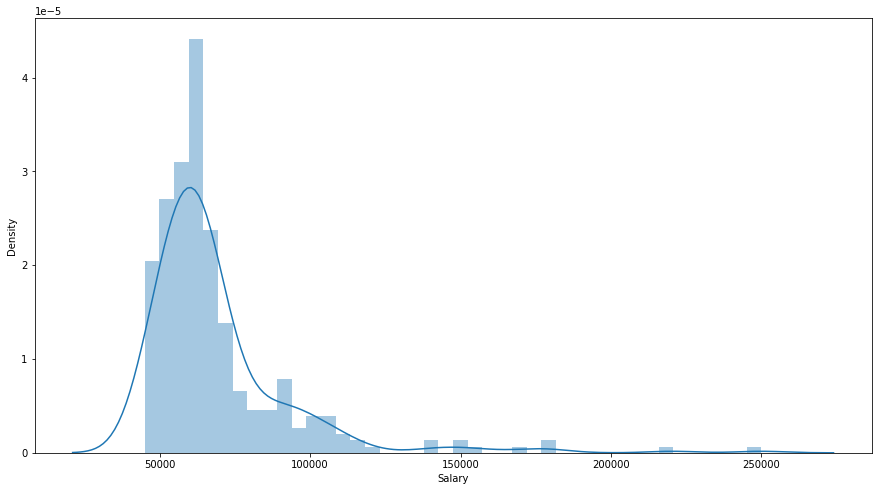

In [ ]:
plt.figure(figsize=(15,8))
sns.distplot(df['Salary'])

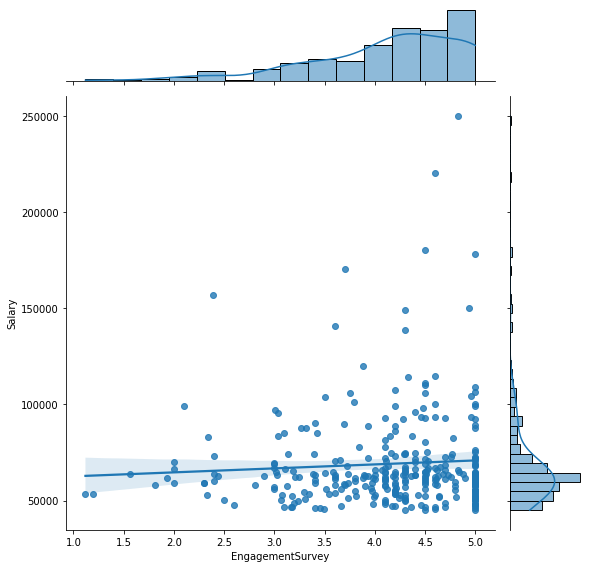

In [ ]:
sns.jointplot(x='EngagementSurvey', y='Salary', 
              data=df, kind='reg', height=8,  palette='cubehelix')

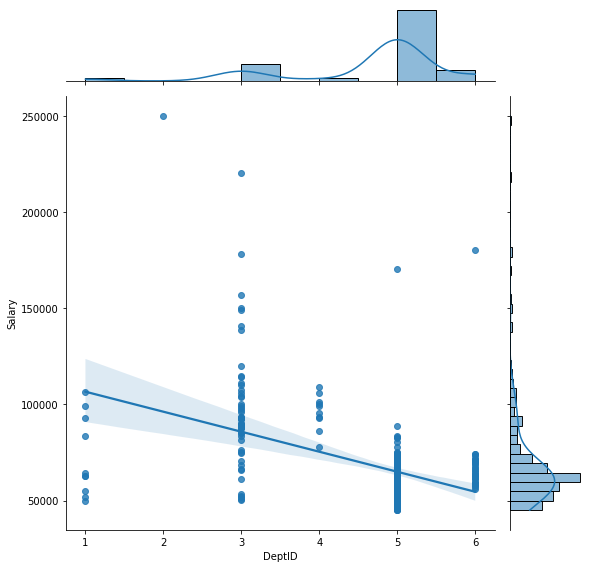

In [ ]:
sns.jointplot(x='DeptID', y='Salary', 
              data=df, kind='reg', height=8,  palette='cubehelix')

In [ ]:
sns.jointplot(x='SpecialProjectsCount', y='Salary', 
              data=df, kind='reg', height=8,  palette='cubehelix')

UFuncTypeError: ignored

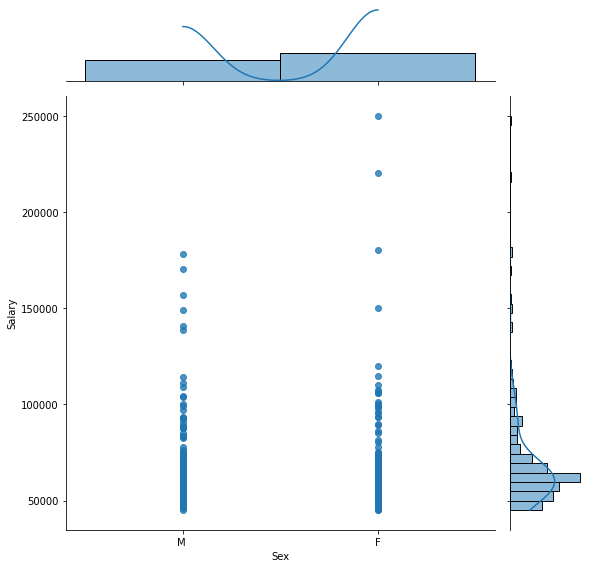

In [ ]:
sns.jointplot(x='Sex', y='Salary', 
              data=df, kind='reg', height=8,  palette='cubehelix')

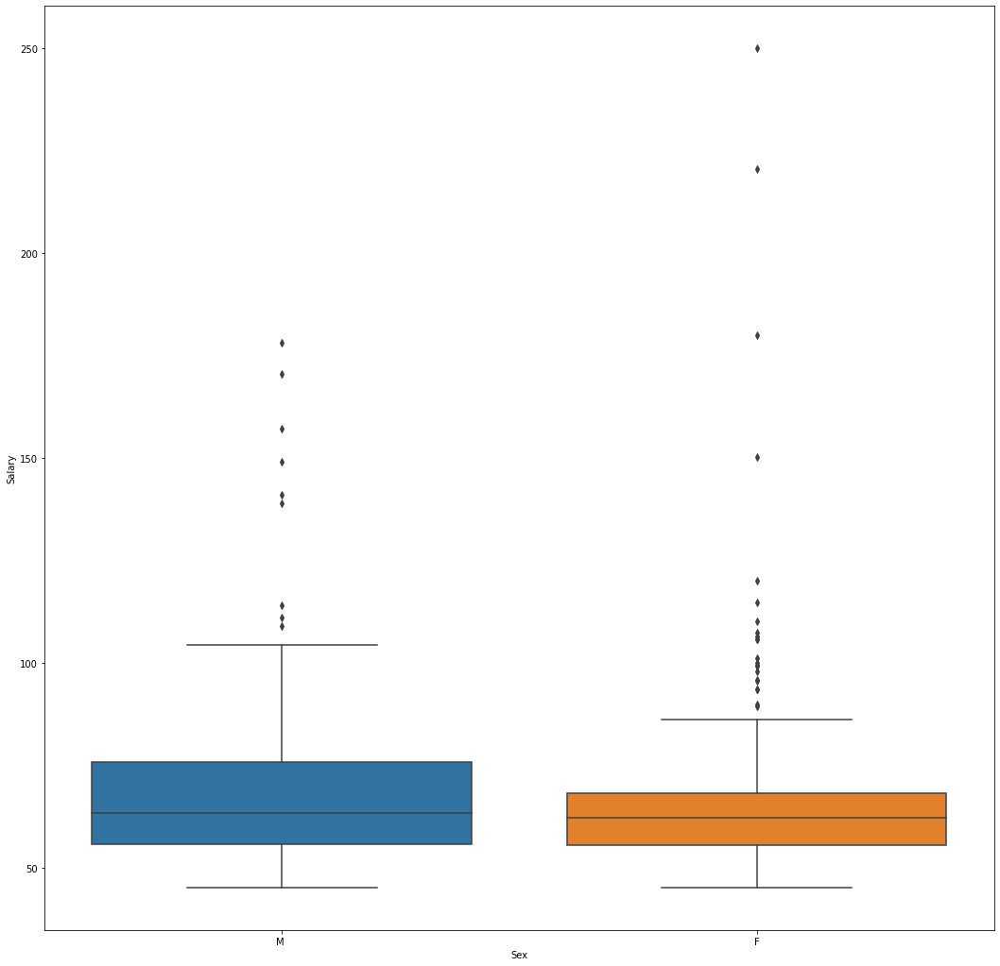

In [ ]:
plt.figure(figsize=(18,18))
sns.boxplot(x=df['Sex'], y=df['Salary']/1000)

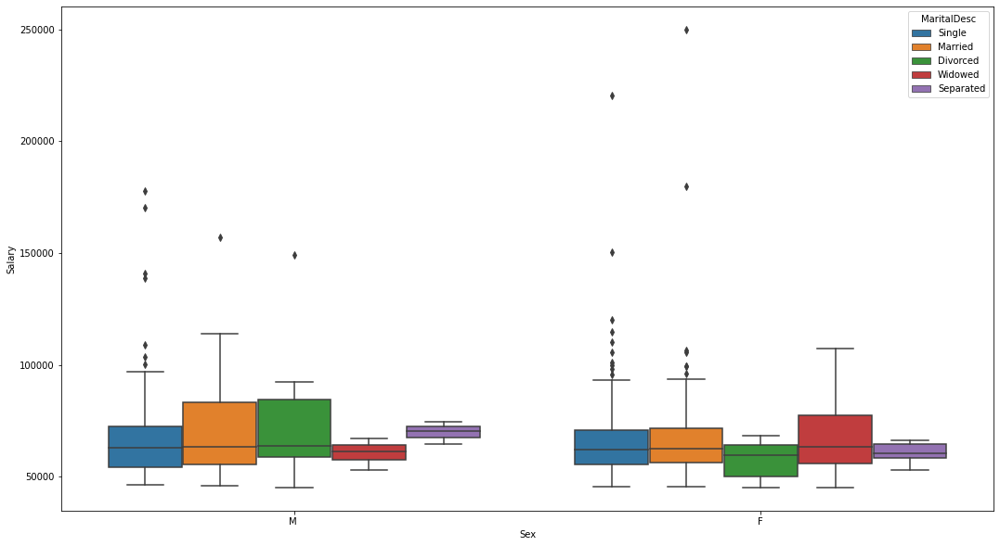

In [ ]:
plt.figure(figsize=(18,10))
sns.boxplot(x=df['Sex'], y=df['Salary'], hue=df['MaritalDesc'])

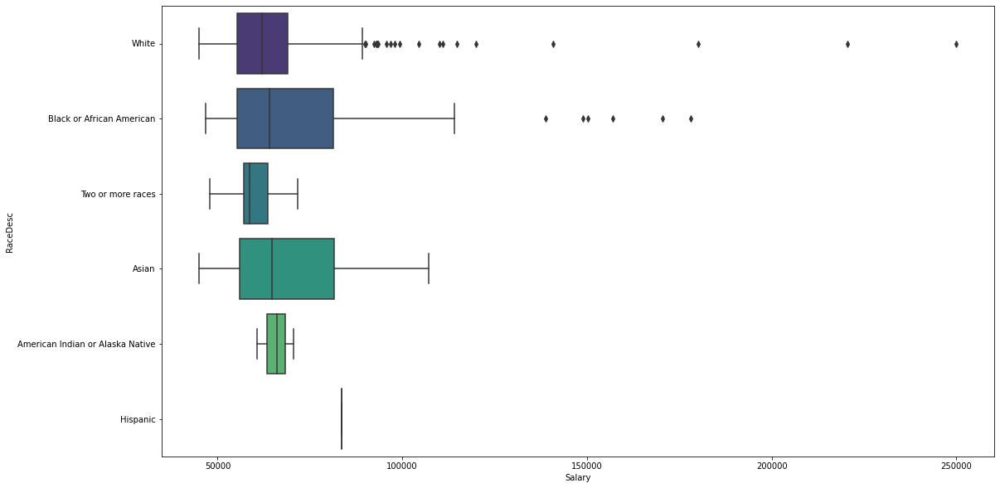

In [ ]:
plt.figure(figsize=(18, 10))
sns.boxplot(y="RaceDesc", x="Salary", data=df, palette='viridis')

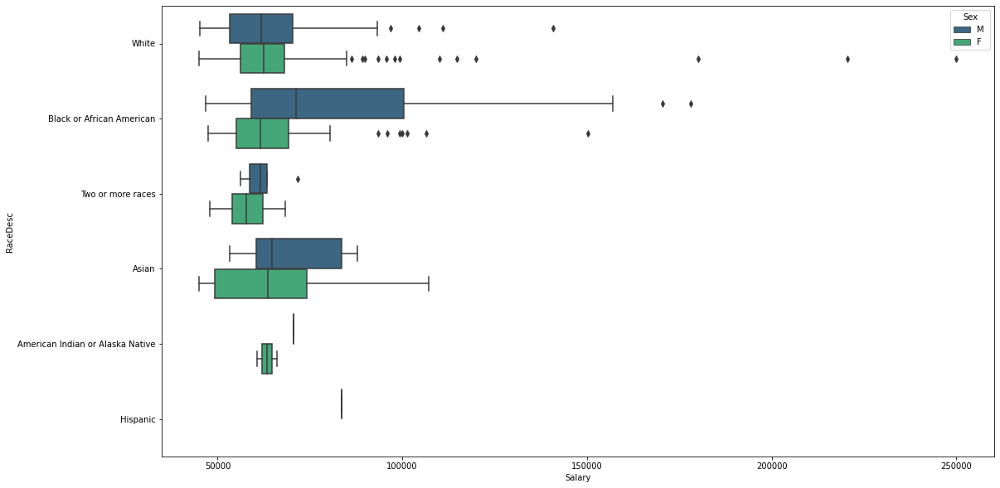

In [ ]:
plt.figure(figsize=(18, 10))
sns.boxplot(y="RaceDesc", x="Salary", hue="Sex",data=df, palette='viridis')

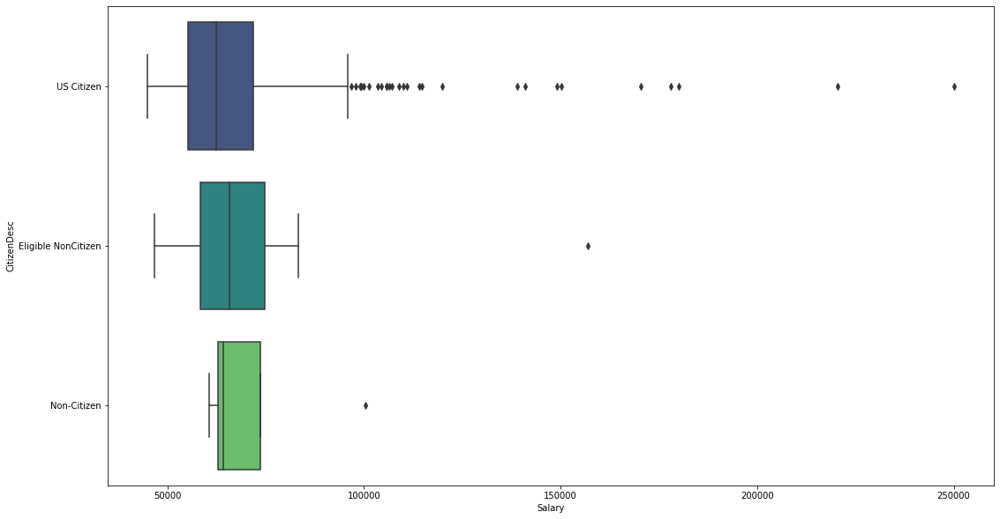

In [ ]:
plt.figure(figsize=(18, 10))
sns.boxplot(y="CitizenDesc", x="Salary", data=df, palette='viridis')